## Loading packages

In [3]:
library(Seurat)
library(reticulate)
library(anndata)
library(Matrix)
library(dplyr)
library(ggplot2)
library(stringr)
library(tidyr)
library(tools)
library(scCustomize)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘anndata’


The following object is masked from ‘package:SeuratObject’:

    Layers



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘tidyr’


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack


Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
scCustomize v2.0.1
If you find the scCustomize useful please cite.
See 'samuel-marsh.github.io/scCustomize/articles/FAQ.html' for citation info.



## Defining functions

In [2]:
my_ad_read <- function(sample_id, file_format, file_path){
    # Read the h5ad file and return the anndata format
    my_file <- paste0(file_path, "/", sample_id, ".", file_format)
    ad <- read_h5ad(my_file)
    return(ad)
}

dgR2dgC <- function(mtx) {
    # Convert dgR matrix from anndata to dgC matrix for seurat
    mtx = as.matrix(mtx)
    mtx = as(mtx, 'dgCMatrix') #将稀疏矩阵转换为Seurat默认的dgC格式
    return(mtx)
}

meta_cal_rb_mt <- function(seurat_data){
    # 这些都是百分号前的整数（需要除以100）
    seurat_data[["percent.mt"]] <- PercentageFeatureSet(seurat_data, pattern = "^mt-")#小鼠线粒体基因是mt-开头，人是MT-
    seurat_data[["percent.ribo"]] <- PercentageFeatureSet(seurat_data, pattern = "^Rp[sl][[:digit:]]")#小鼠核糖体基因是Rps/Rpl-开头，人是RPS/RPL
    #seurat_data[["percent.redcell"]] <- PercentageFeatureSet(seurat_data, pattern = "^HB-")
    # 将每个细胞每个UMI的基因数目添加到元数据中.这个指标让我们了解数据集的复杂性（每个UMI检测到的基因越多，我们的数据越复杂）
    seurat_data$log10GenesPerUMI <- log10(seurat_data$nFeature_RNA) / log10(seurat_data$nCount_RNA)
    metadata <- seurat_data@meta.data
    metadata$riboRatio <- metadata$percent.ribo / 100
    metadata$mitoRatio <- metadata$percent.mt / 100
    return(metadata)
}

is_odds <- function(vector){
    # This function return the index of the odds elements in a vector
    return((vector %% 2) == 1)
}

meta_sample_info <- function(metadata){
    # Manipulate the meta info to facilitate the following analysis
    print(paste0("Manipulating", " ", metadata$sample_id[1]))
    # Assign the genotypes
    metadata$genotype <- vector(length = length(nrow(metadata)))
    metadata$genotype[metadata$sample_id %>% str_detect("HZ") %>% which()] <- "5XFAD"
    metadata$genotype[metadata$sample_id %>% str_detect("WT") %>% which()] <- "control"
    metadata$genotype %>% table() %>% print()
    # Assign the sample information
    end_of_month_number <- strsplit(metadata$sample_id[1] %>% as.character(), split = "") %>% unlist() %>% str_detect("M") %>% which()
    metadata$sample <- metadata$sample_id %>% str_sub(1, end_of_month_number + 2)
    metadata$sample %>% table() %>% print()
    metadata$slide <- metadata$sample_id %>% str_sub(end_of_month_number + 4, )
    metadata$slide %>% table() %>% print()
    metadata$month <- metadata$sample_id %>% str_sub(3, end_of_month_number)    
    metadata$month %>% table() %>% print()
    # Assign slice position
    last_number <- metadata$sample %>% substr(nchar(metadata$sample), nchar(metadata$sample)) %>% as.integer()
    odds_index <- last_number %>% is_odds() %>% which()
    even_index <- (!(last_number %>% is_odds())) %>% which()
    metadata$slice <- vector(length = length(nrow(metadata)))
    metadata$slice[odds_index] <- "cortex"
    metadata$slice[even_index] <- "hippo"
    metadata$slice %>% table() %>% print()
    # Assign Mouse ID
    mouse1 <- (last_number < 3) %>% which()
    mouse2 <- (3 <= last_number & last_number < 5) %>% which()
    mouse3 <- (5 <= last_number) %>% which()
    metadata$mouse <- vector(length = length(nrow(metadata)))
    metadata$mouse[mouse1] <- paste0(metadata$genotype[mouse1], "_", metadata$month[mouse1], "_", "mouse1")
    metadata$mouse[mouse2] <- paste0(metadata$genotype[mouse2], "_", metadata$month[mouse2], "_", "mouse2")
    metadata$mouse[mouse3] <- paste0(metadata$genotype[mouse3], "_", metadata$month[mouse3], "_", "mouse3")
    metadata$mouse %>% table() %>% print()
    print("Finished current sample")
    return(metadata)
}

ad2seurat_bin50 <- function(ad){
    # Convert bin50 data from anndata form to seurat form in combination
    meta <- ad$obs
    meta <- meta %>% as_tibble(rownames = "pandas.index")
    ad_dgC <- t(dgR2dgC(ad$X))
    seurat_data <- CreateSeuratObject(counts = ad_dgC,
                           assay = "RNA",
                           meta.data = meta,
                           project = "bin50")
    return(seurat_data)
}

my_seurat_read <- function(sample_id, file_format, file_path){
    # Read the h5ad file and return the data in seurat form
    # 想直接从文件名读seurat就用这个
    ad <- my_ad_read(sample_id, file_format, file_path)
    ad <- ad2seurat_bin50(ad)
    ad@meta.data$sample_id <- sample_id
    return(ad)
}

my_feature_plot <- function(seurat_data, features){
    # The features should be combined and passed as a string
    tmp_data <- FetchData(object = seurat_data, vars = c("x", "y", "sample_id", features), layer = "data")
    tmp_data <- tmp_data %>% gather(key = "features", value = "expression", 4:length(colnames(tmp_data)))

    tmp_data %>%
        ggplot(aes(x = x, y = y, color = expression)) +
        geom_point(size = 0.1) +
        scale_colour_gradient(low = "white", high = "blue") +
        theme_classic() + 
        coord_fixed() +
        facet_wrap(vars(sample_id, features))
}

merge_seurat <- function(element_1, element_2){
    # merge the seurat objects
    merge(element_1, element_2, add.cell.ids = c("", element_2$orig.ident[1]))
}

read_anns_bin50 <- function(folder_path, pattern) {
    # Read the anndata files from the designated folder and return the merged seurat object
    file_list <- list.files(path = folder_path, pattern = pattern)
    sample_ids  <- file_list %>% str_sub(1, -13)
    print(sample_ids)

    seurat_list <- vector("list", length(sample_ids))
    names(seurat_list) <- sample_ids
# Starts to reading here
    for (sample_id in sample_ids){
        print(paste0("Now reading ", sample_id, " sample"))
        seurat_list[sample_id] <- my_seurat_read(sample_id = sample_id,
                file_format = "seurat.h5ad",
                file_path = folder_path)
    }
# Merge
    merged_seurat <- Reduce(merge_seurat, seurat_list)
# Assign metadata
    merged_seurat@meta.data <- merged_seurat %>% meta_cal_rb_mt() %>% meta_sample_info()
# return the data
    return(merged_seurat)
}


# 6M

In [3]:
merged_6M <- read_anns_bin50(folder_path = "/public/home/jijh/st_project/bin50_analysis/lasso_bin50_anndata", pattern = "6M")
saveRDS(merged_6M, file = paste0("/home1/jijh/st_project/bin50_analysis/inter_files/", "merged_6M.rds"))
bulk_6M <- AggregateExpression(merged_6M, return.seurat = TRUE, group.by = "sample_id")
saveRDS(bulk_6M, file = "/home1/jijh/st_project/bin50_analysis/inter_files/6M_test_total.rds")

 [1] "HZ6M01_D02570A2" "HZ6M02_D02570A3" "HZ6M03_B02210D4" "HZ6M04_B02210D5"
 [5] "HZ6M05_B02210D6" "HZ6M06_B02210E1" "WT6M01_C02228C2" "WT6M02_C02228C3"
 [9] "WT6M03_C02228C4" "WT6M04_C02228C5" "WT6M06_C02228D4"
[1] "Now reading HZ6M01_D02570A2 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 14.2 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading HZ6M02_D02570A3 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 15.7 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading HZ6M03_B02210D4 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 13.4 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading HZ6M04_B02210D5 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 17.2 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading HZ6M05_B02210D6 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 13.2 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading HZ6M06_B02210E1 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 15.0 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading WT6M01_C02228C2 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 13.3 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading WT6M02_C02228C3 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 16.5 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading WT6M03_C02228C4 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 14.1 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading WT6M04_C02228C5 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 14.6 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Now reading WT6M06_C02228D4 sample"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 16.8 GiB”
Warning message:
“Setting row names on a tibble is deprecated.”
Warning message in `[<-`(`*tmp*`, sample_id, value = my_seurat_read(sample_id = sample_id, :
“implicit list embedding of S4 objects is deprecated”


[1] "Manipulating HZ6M01_D02570A2"
.
  5XFAD control 
 455893  393227 
.
HZ6M01 HZ6M02 HZ6M03 HZ6M04 HZ6M05 HZ6M06 WT6M01 WT6M02 WT6M03 WT6M04 WT6M06 
 73095  81858  68297  87152  68137  77354  70856  83707  73306  74933  90425 
.
B02210D4 B02210D5 B02210D6 B02210E1 C02228C2 C02228C3 C02228C4 C02228C5 
   68297    87152    68137    77354    70856    83707    73306    74933 
C02228D4 D02570A2 D02570A3 
   90425    73095    81858 
.
    6M 
849120 
.
cortex  hippo 
353691 495429 
.
  5XFAD_6M_mouse1   5XFAD_6M_mouse2   5XFAD_6M_mouse3 control_6M_mouse1 
           154953            155449            145491            154563 
control_6M_mouse2 control_6M_mouse3 
           148239             90425 
[1] "Finished current sample"


Names of identity class contain underscores ('_'), replacing with dashes ('-')
This message is displayed once every 8 hours.
Centering and scaling data matrix



In [1]:
merged_6M <- readRDS(file = paste0("/home1/jijh/st_project/bin50_analysis/inter_files/", "merged_6M.rds"))

In [5]:
merged_6M@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,pandas.index,x,y,sample_id,percent.mt,percent.ribo,log10GenesPerUMI,riboRatio,mitoRatio,genotype,sample,slide,month,slice,mouse
,<chr>,<dbl>,<int>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
__________34_146,HZ6M01_D02570A2,695,330,34_146,6325,14975,HZ6M01_D02570A2,0.4316547,3.021583,0.8861814,0.03021583,0.004316547,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________84_74,HZ6M01_D02570A2,1513,638,84_74,8825,11375,HZ6M01_D02570A2,0.9253139,2.445473,0.8820638,0.02445473,0.009253139,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________102_185,HZ6M01_D02570A2,758,377,102_185,9725,16925,HZ6M01_D02570A2,2.1108179,2.902375,0.8946657,0.02902375,0.021108179,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________134_314,HZ6M01_D02570A2,785,474,134_314,11325,23375,HZ6M01_D02570A2,0.8917197,4.585987,0.9243174,0.04585987,0.008917197,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________160_4,HZ6M01_D02570A2,618,306,160_4,12625,7875,HZ6M01_D02570A2,1.1326861,2.265372,0.8906240,0.02265372,0.011326861,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________166_194,HZ6M01_D02570A2,1015,513,166_194,12925,17375,HZ6M01_D02570A2,1.2807882,5.024631,0.9014296,0.05024631,0.012807882,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________169_72,HZ6M01_D02570A2,624,363,169_72,13075,11275,HZ6M01_D02570A2,1.4423077,2.083333,0.9158274,0.02083333,0.014423077,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________173_189,HZ6M01_D02570A2,1203,630,173_189,13275,17125,HZ6M01_D02570A2,0.9143807,3.906899,0.9087984,0.03906899,0.009143807,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1
__________186_179,HZ6M01_D02570A2,1226,608,186_179,13925,16625,HZ6M01_D02570A2,0.7340946,4.649266,0.9013800,0.04649266,0.007340946,5XFAD,HZ6M01,D02570A2,6M,cortex,5XFAD_6M_mouse1


## QC Plot

### Brain Plot

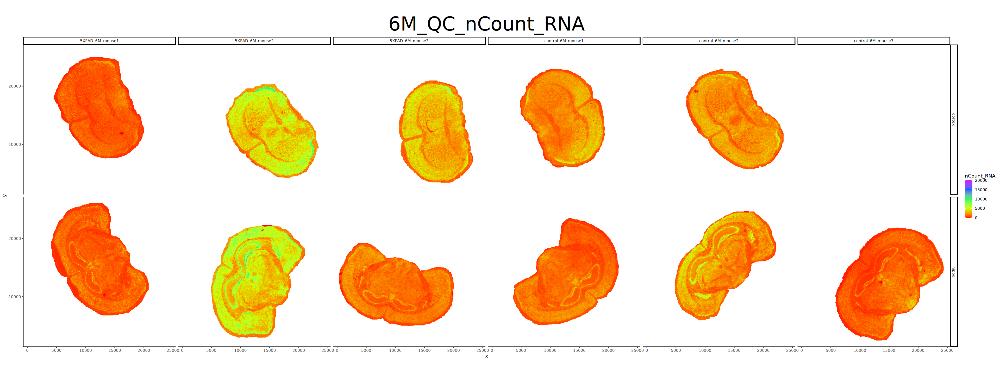

In [5]:
# UMI Counts Brain Plot
options(repr.plot.width = 32, repr.plot.height = 12)
merged_6M@meta.data %>% 
    ggplot(aes(x = x, y = y, color  = nCount_RNA)) +
    geom_point(size = 0.1) +
    scale_colour_gradientn(colours=rainbow(5),
                          limits = c(0, 20000)) +
    theme_classic() + 
    coord_fixed() +
    facet_grid(cols = vars(mouse), rows = vars(slice)) +
    ggtitle("6M_QC_nCount_RNA") +
    theme(plot.title = element_text(hjust = 0.5, size = rel(4), family = "bold"))

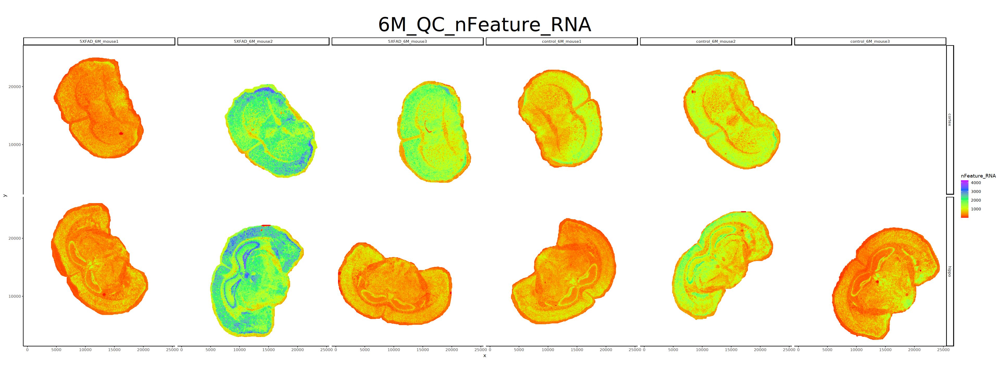

In [6]:
# Features Count Brain Plot
options(repr.plot.width = 32, repr.plot.height = 12)
merged_6M@meta.data %>% 
    ggplot(aes(x = x, y = y, color  = nFeature_RNA)) +
    geom_point(size = 0.1) +
    scale_colour_gradientn(colours=rainbow(5)) +
    theme_classic() + 
    coord_fixed() +
    facet_grid(cols = vars(mouse), rows = vars(slice)) +
    ggtitle("6M_QC_nFeature_RNA") +
    theme(plot.title = element_text(hjust = 0.5, size = rel(4), family = "bold"))

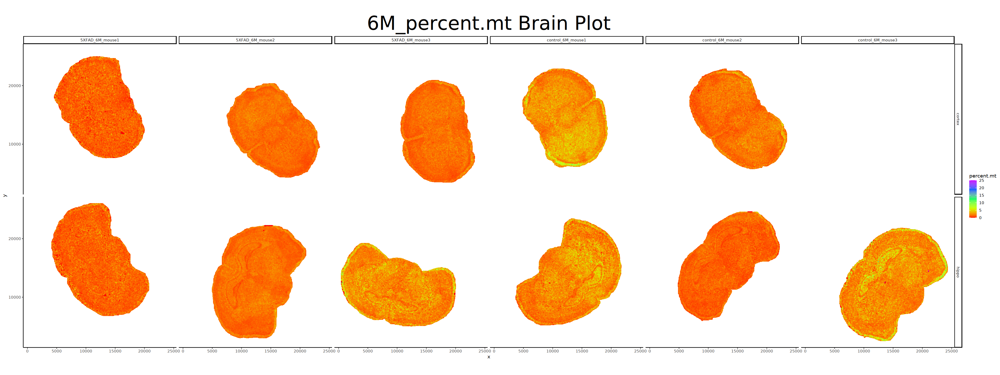

In [7]:
# percent.mito Brain Plot
options(repr.plot.width = 32, repr.plot.height = 12)
merged_6M@meta.data %>% 
    ggplot(aes(x = x, y = y, color  = percent.mt)) +
    geom_point(size = 0.1) +
    scale_colour_gradientn(colours=rainbow(5)) +
    theme_classic() + 
    coord_fixed() +
    facet_grid(cols = vars(mouse), rows = vars(slice)) +
    ggtitle("6M_percent.mt Brain Plot") +
    theme(plot.title = element_text(hjust = 0.5, size = rel(4), family = "bold"))

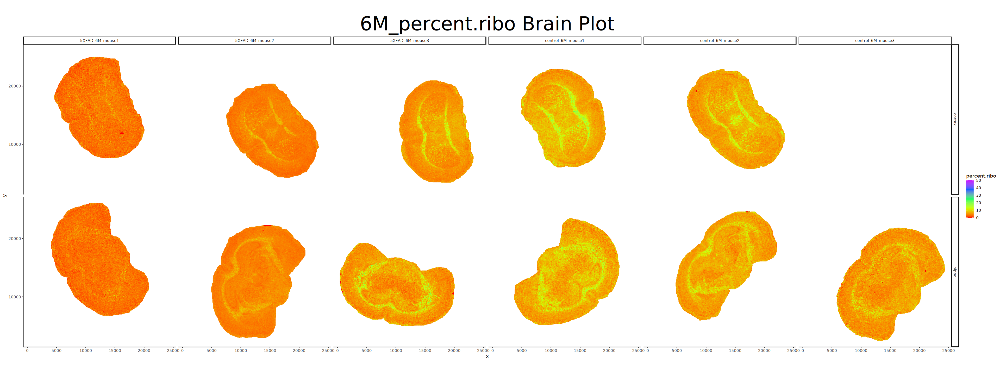

In [8]:
options(repr.plot.width = 32, repr.plot.height = 12)
merged_6M@meta.data %>% 
    ggplot(aes(x = x, y = y, color  = percent.ribo)) +
    geom_point(size = 0.1) +
    scale_colour_gradientn(colours=rainbow(5)) +
    theme_classic() + 
    coord_fixed() +
    facet_grid(cols = vars(mouse), rows = vars(slice)) +
    ggtitle("6M_percent.ribo Brain Plot") +
    theme(plot.title = element_text(hjust = 0.5, size = rel(4), family = "bold"))

### Linear Plot

`geom_smooth()` using formula = 'y ~ x'


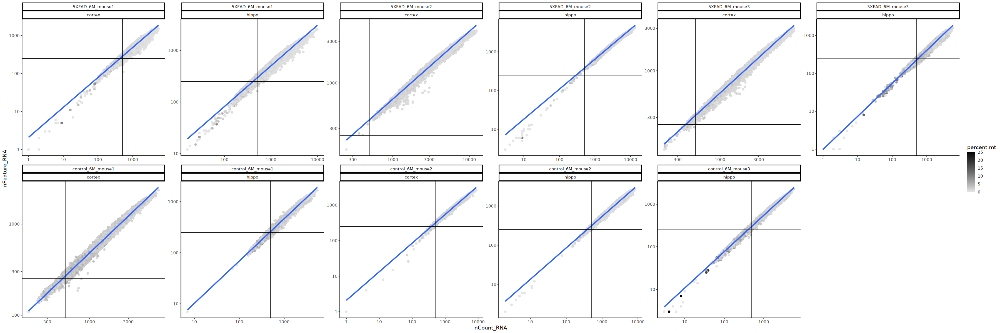

In [9]:
# UMI versus Features counts + percent.mito
options(repr.plot.width = 30, repr.plot.height = 10)
merged_6M@meta.data %>%
    ggplot(aes(x = nCount_RNA, y = nFeature_RNA)) +
    geom_point(aes(color = percent.mt)) +
    scale_colour_gradient(low = "gray90", high = "black") +
    stat_smooth(method = lm) +
    scale_x_log10() +
    scale_y_log10() +
    theme_classic() +
    geom_vline(xintercept = 500) +
    geom_hline(yintercept = 250) +
    facet_wrap(vars(mouse, slice), 
               scale = "free",
              nrow = 2)

### Density Plot

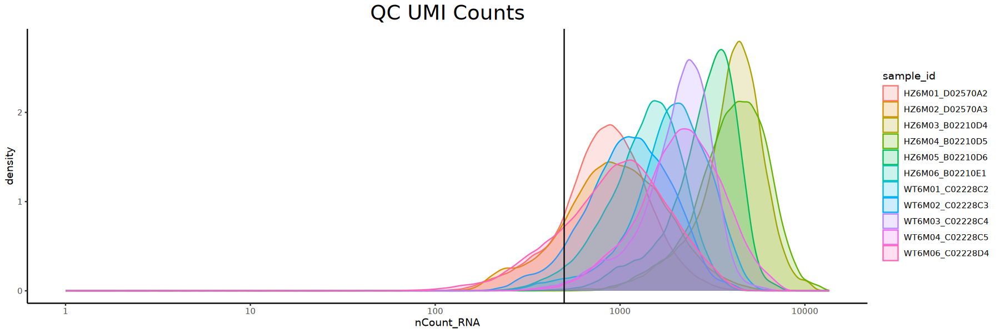

In [10]:
# UMI counts QC plot
options(repr.plot.width = 15, repr.plot.height = 5)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = nCount_RNA, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
    scale_x_log10() +
  	theme_classic() +
  	geom_vline(xintercept = 500) +
    ggtitle("QC UMI Counts")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold"))

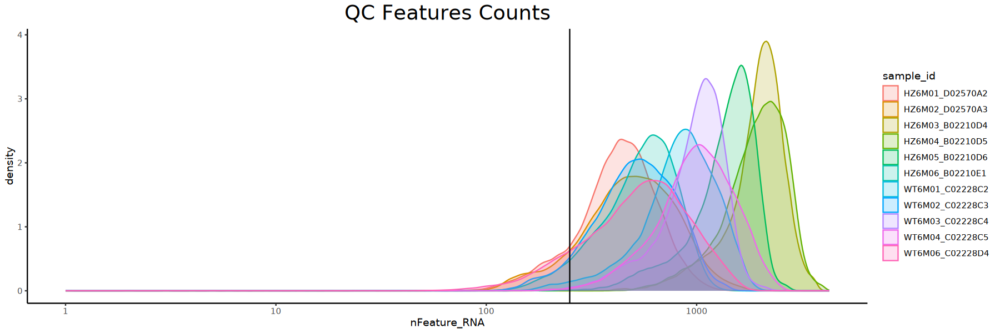

In [11]:
# features counts QC plot
options(repr.plot.width = 15, repr.plot.height = 5)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = nFeature_RNA, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
    scale_x_log10() +
  	theme_classic() +
  	geom_vline(xintercept = 250) +
    ggtitle("QC Features Counts")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold"))

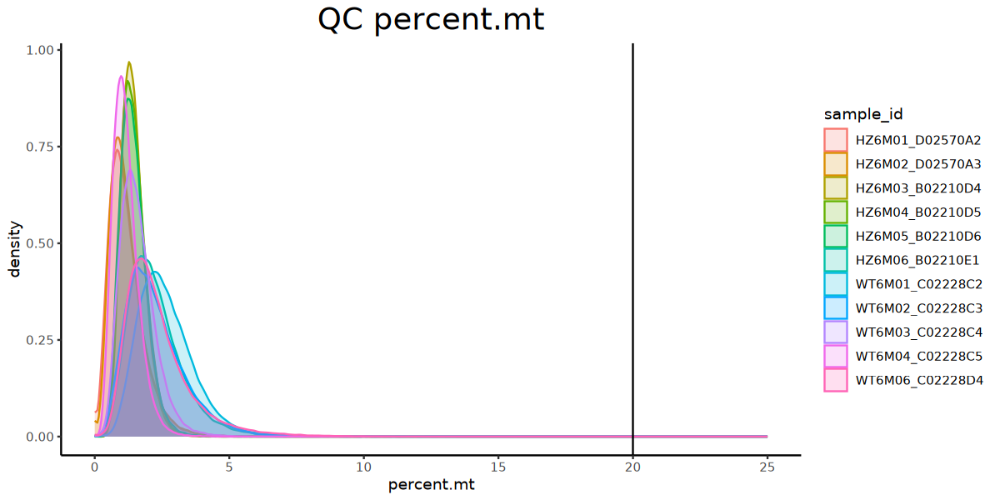

In [12]:
# percent.mito QC plot
options(repr.plot.width = 10, repr.plot.height = 5)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = percent.mt, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
  	theme_classic() +
  	geom_vline(xintercept = 20) +
    ggtitle("QC percent.mt")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold"))

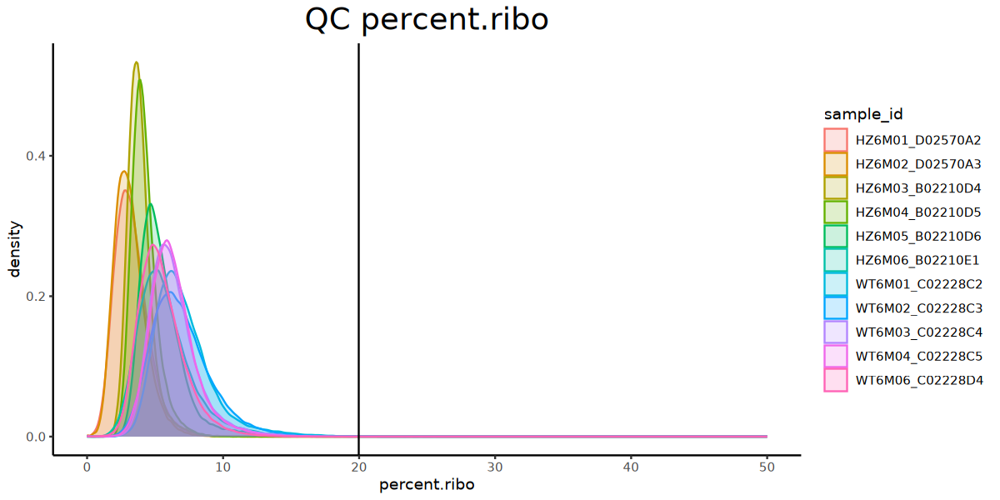

In [13]:
# percent.ribo QC plot
options(repr.plot.width = 10, repr.plot.height = 5)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = percent.ribo, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
  	theme_classic() +
  	geom_vline(xintercept = 20) +
    ggtitle("QC percent.ribo")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold"))

Warning message:
“Removed 14 rows containing non-finite values (`stat_density()`).”


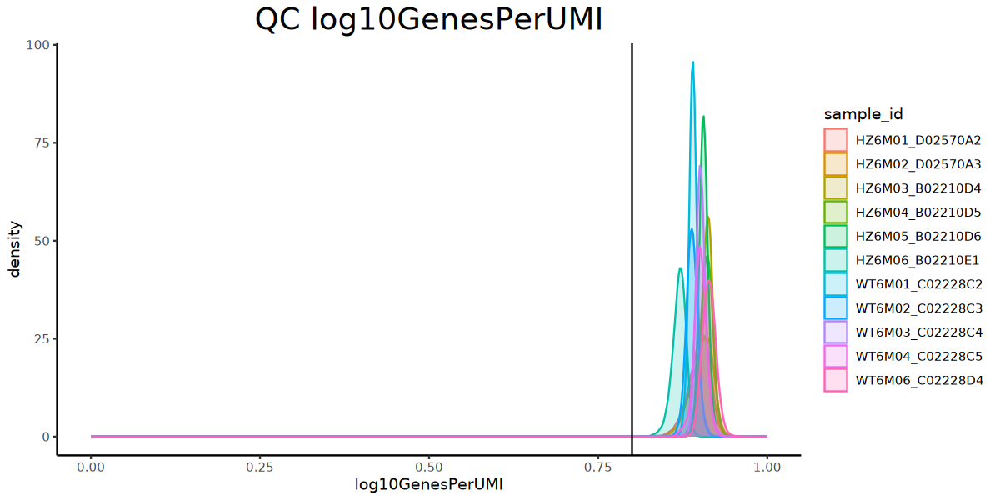

In [14]:
# log10GenesPerUMI
options(repr.plot.width = 10, repr.plot.height = 5)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = log10GenesPerUMI, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
  	theme_classic() +
  	geom_vline(xintercept = 0.8) +
    ggtitle("QC log10GenesPerUMI")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold"))

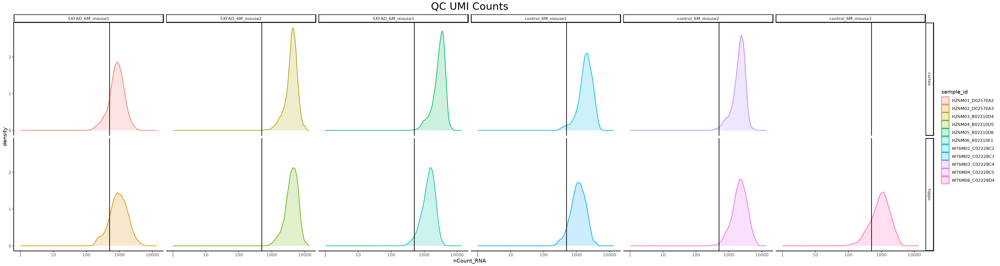

In [15]:
# Facet QC Counts
options(repr.plot.width = 30, repr.plot.height = 8)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = nCount_RNA, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
    scale_x_log10() +
  	theme_classic() +
  	geom_vline(xintercept = 500) +
    ggtitle("QC UMI Counts")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold")) +
    facet_grid(rows = vars(slice), cols = vars(mouse))

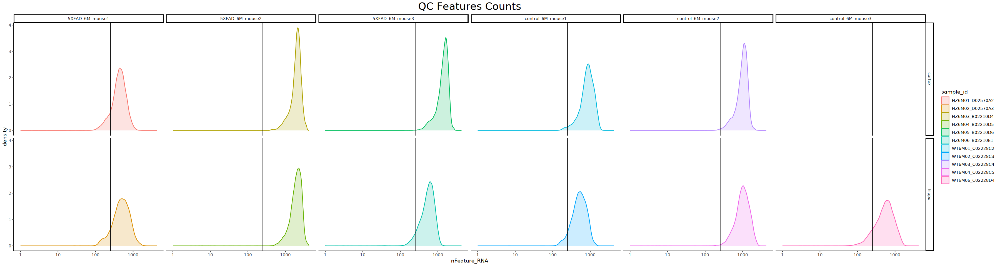

In [16]:
# Facet Features Counts
options(repr.plot.width = 30, repr.plot.height = 8)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = nFeature_RNA, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
    scale_x_log10() +
  	theme_classic() +
  	geom_vline(xintercept = 250) +
    ggtitle("QC Features Counts")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold")) +
    facet_grid(rows = vars(slice), cols = vars(mouse))

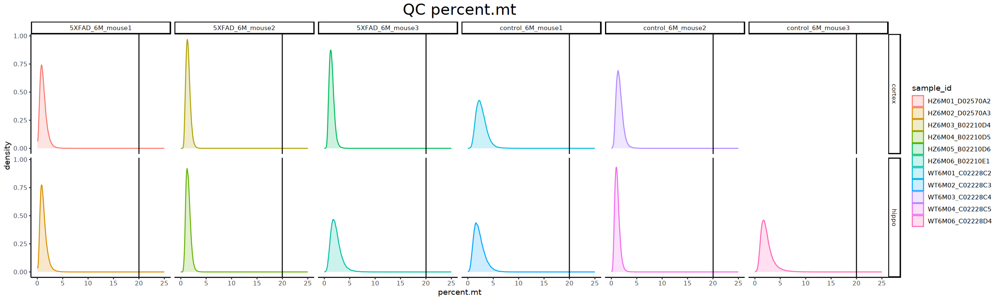

In [17]:
# Facet Mito percent
options(repr.plot.width = 20, repr.plot.height = 6)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = percent.mt, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
  	theme_classic() +
  	geom_vline(xintercept = 20) +
    ggtitle("QC percent.mt")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold")) +
    facet_grid(rows = vars(slice), cols = vars(mouse))

Warning message:
“Removed 14 rows containing non-finite values (`stat_density()`).”


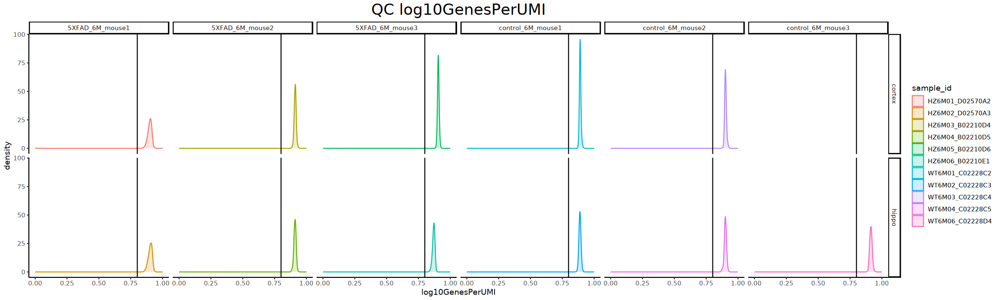

In [18]:
# Facet log10GenesPerUMI
options(repr.plot.width = 20, repr.plot.height = 6)
# 通过可视化每一个UMI检测到的基因数来可视化基因表达的整体复杂性
merged_6M@meta.data %>%
    ggplot(aes(x = log10GenesPerUMI, color = sample_id, fill = sample_id)) +
  	geom_density(alpha = 0.2) +
  	theme_classic() +
  	geom_vline(xintercept = 0.8) +
    ggtitle("QC log10GenesPerUMI")+
    theme(plot.title = element_text(hjust = 0.5, vjust = 1.1, size = rel(2), family = "bold")) +
    facet_grid(rows = vars(slice), cols = vars(mouse))